In [141]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt

import seaborn as sns 
from sklearn.linear_model import LinearRegression,LogisticRegression

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,multilabel_confusion_matrix


from sklearn.preprocessing import MinMaxScaler,StandardScaler

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

### 1.Problem Statment

In [ ]:
"""In any supply chain, the ability to forecast demand and optimize the supply chain process is essential for efficient 
operations and profitability. The challenge is to accurately predict the demand for products and optimize the supply chain
process to minimize costs while meeting customer demand.

The objective of this project is to develop a machine learning model that can accurately forecast demand and optimize the
supply chain process for a given product or product category. The model should be able to predict demand for a specific time 
period (e.g. a week or a month) based on historical sales data, market trends, and other relevant factors.

The outcome of this project will be an optimized supply chain process that can meet customer demand while minimizing costs.
The project can be applied to various industries such as retail, manufacturing, and logistics."""

### 2.Data Gathering

In [10]:
#Read the excel file using read_excel
#method of pandas
df=pd.read_excel("Data Supply chain.xlsx")
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,2,2,85.220001,262.200012,Shipping on time,0,73,Sporting Goods,Detroit,EE. UU.,XXXXXXXXX,Odessa,19409,Cherry,XXXXXXXXX,Corporate,MI,4148 Indian Landing,48205,2,Fitness,42.401096,-82.925133,Pacific Asia,Shanghái,China,19409,2018-01-12 07:23:00,75856,1360,65.550003,0.20,179171,327.75,0.33,1,327.75,262.200012,85.220001,Eastern Asia,Shanghái,ON_HOLD,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-14 07:23:00,Second Class
1,PAYMENT,2,1,63.910000,245.809998,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Rose,19408,Mack,XXXXXXXXX,Consumer,PR,4690 Quiet Hickory Campus,725,2,Fitness,18.200027,-66.037048,Pacific Asia,Depok,Indonesia,19408,2018-01-12 07:02:00,75855,1360,81.940002,0.25,179170,327.75,0.26,1,327.75,245.809998,63.910000,Southeast Asia,Yogyakarta,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-14 07:02:00,First Class
2,DEBIT,5,2,-273.019989,327.750000,Late delivery,1,73,Sporting Goods,Murfreesboro,EE. UU.,XXXXXXXXX,Linda,19407,Haley,XXXXXXXXX,Consumer,TN,8659 Foggy Deer Port,37130,2,Fitness,36.044895,-86.353271,Pacific Asia,Depok,Indonesia,19407,2018-01-12 06:41:00,75854,1360,0.000000,0.00,179169,327.75,-0.83,1,327.75,327.750000,-273.019989,Southeast Asia,Yogyakarta,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-17 06:41:00,Second Class
3,PAYMENT,4,2,-259.579987,324.470001,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,May,19406,Kennedy,XXXXXXXXX,Consumer,PR,8284 Colonial Gate Path,725,2,Fitness,18.233534,-66.037064,Pacific Asia,Kawasaki,Japón,19406,2018-01-12 06:20:00,75853,1360,3.280000,0.01,179168,327.75,-0.80,1,327.75,324.470001,-259.579987,Eastern Asia,Kanagawa,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-16 06:20:00,Second Class
4,DEBIT,3,4,20.240000,321.200012,Advance shipping,0,73,Sporting Goods,Cleveland,EE. UU.,XXXXXXXXX,Lilah,19405,Holmes,XXXXXXXXX,Corporate,OH,7701 Rustic Carrefour,44102,2,Fitness,41.472141,-81.736816,Pacific Asia,Lahore,Pakistán,19405,2018-01-12 05:59:00,75852,1360,6.560000,0.02,179167,327.75,0.06,1,327.75,321.200012,20.240000,South Asia,Punyab,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-15 05:59:00,Standard Class


In [11]:
#To display all columns
pd.set_option("display.max_columns",None)     
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,2,2,85.220001,262.200012,Shipping on time,0,73,Sporting Goods,Detroit,EE. UU.,XXXXXXXXX,Odessa,19409,Cherry,XXXXXXXXX,Corporate,MI,4148 Indian Landing,48205,2,Fitness,42.401096,-82.925133,Pacific Asia,Shanghái,China,19409,2018-01-12 07:23:00,75856,1360,65.550003,0.20,179171,327.75,0.33,1,327.75,262.200012,85.220001,Eastern Asia,Shanghái,ON_HOLD,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-14 07:23:00,Second Class
1,PAYMENT,2,1,63.910000,245.809998,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Rose,19408,Mack,XXXXXXXXX,Consumer,PR,4690 Quiet Hickory Campus,725,2,Fitness,18.200027,-66.037048,Pacific Asia,Depok,Indonesia,19408,2018-01-12 07:02:00,75855,1360,81.940002,0.25,179170,327.75,0.26,1,327.75,245.809998,63.910000,Southeast Asia,Yogyakarta,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-14 07:02:00,First Class
2,DEBIT,5,2,-273.019989,327.750000,Late delivery,1,73,Sporting Goods,Murfreesboro,EE. UU.,XXXXXXXXX,Linda,19407,Haley,XXXXXXXXX,Consumer,TN,8659 Foggy Deer Port,37130,2,Fitness,36.044895,-86.353271,Pacific Asia,Depok,Indonesia,19407,2018-01-12 06:41:00,75854,1360,0.000000,0.00,179169,327.75,-0.83,1,327.75,327.750000,-273.019989,Southeast Asia,Yogyakarta,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-17 06:41:00,Second Class
3,PAYMENT,4,2,-259.579987,324.470001,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,May,19406,Kennedy,XXXXXXXXX,Consumer,PR,8284 Colonial Gate Path,725,2,Fitness,18.233534,-66.037064,Pacific Asia,Kawasaki,Japón,19406,2018-01-12 06:20:00,75853,1360,3.280000,0.01,179168,327.75,-0.80,1,327.75,324.470001,-259.579987,Eastern Asia,Kanagawa,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-16 06:20:00,Second Class
4,DEBIT,3,4,20.240000,321.200012,Advance shipping,0,73,Sporting Goods,Cleveland,EE. UU.,XXXXXXXXX,Lilah,19405,Holmes,XXXXXXXXX,Corporate,OH,7701 Rustic Carrefour,44102,2,Fitness,41.472141,-81.736816,Pacific Asia,Lahore,Pakistán,19405,2018-01-12 05:59:00,75852,1360,6.560000,0.02,179167,327.75,0.06,1,327.75,321.200012,20.240000,South Asia,Punyab,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-15 05:59:00,Standard Class


### 3.EDA

In [12]:
#df.shape returns  the dimensions of the DataFrame 
#The first value in the tuple represents the number of rows and the second value represents the number of columns.

df.shape 

(401, 53)

#### 3.1 Missing values

In [ ]:
#The df.isna().sum() syntax returns the number of missing values  for each column in the dataframe

In [13]:
df.isna().sum() 

Type                               0
Days for shipping (real)           0
Days for shipment (scheduled)      0
Benefit per order                  0
Sales per customer                 0
Delivery Status                    0
Late_delivery_risk                 0
Category Id                        0
Category Name                      0
Customer City                      0
Customer Country                   0
Customer Email                     0
Customer Fname                     0
Customer Id                        0
Customer Lname                     0
Customer Password                  0
Customer Segment                   0
Customer State                     0
Customer Street                    0
Customer Zipcode                   0
Department Id                      0
Department Name                    0
Latitude                           0
Longitude                          0
Market                             0
Order City                         0
Order Country                      0
O

#### >> Insight

In [ ]:
In above dataset their are two missing values
1. Product Description column has 401 missing values, and 
2. Order Zipcode column has 385 missing values. 
3. All other columns have 0 missing values.

In [14]:
#check null values in original dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 53 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Type                           401 non-null    object        
 1   Days for shipping (real)       401 non-null    int64         
 2   Days for shipment (scheduled)  401 non-null    int64         
 3   Benefit per order              401 non-null    float64       
 4   Sales per customer             401 non-null    float64       
 5   Delivery Status                401 non-null    object        
 6   Late_delivery_risk             401 non-null    int64         
 7   Category Id                    401 non-null    int64         
 8   Category Name                  401 non-null    object        
 9   Customer City                  401 non-null    object        
 10  Customer Country               401 non-null    object        
 11  Customer Email     

### 3.2 cleaning the data

In [ ]:
Insights:
Following tables needed to be dropped

1. Days for shipping (real)----> Irrelevant data wrt project
2. Days for shipment (scheduled)-----> Irrelevant data wrt project
3. Delivery Status-----> Irrelevant data wrt project
4. Late_delivery_risk-----> Irrelevant data wrt project
5. Customer Email-----> No values present as they were hidden and Irrelevant data wrt project
6. Customer Password-----> No values present as they were hidden and Irrelevant data wrt project,
7. Order Zipcode---> 99% data of this column is null
8. Product Description---> 99% data of this column is null
9. Product Image----> Irrelevant data as only links of product available in the coloumn
10. Product Status----> Irrelevant data wrt project
11. Shipping Mode---> Irrelevant data wrt project



In [15]:
df.drop(['Days for shipping (real)','Days for shipment (scheduled)','Delivery Status','Late_delivery_risk', 'Product Description', 'Customer Email','Customer Password','Order Zipcode','Product Image','Product Status','Shipping Mode'], axis=1, inplace=True)
df.head()

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders)
0,DEBIT,85.220001,262.200012,73,Sporting Goods,Detroit,EE. UU.,Odessa,19409,Cherry,Corporate,MI,4148 Indian Landing,48205,2,Fitness,42.401096,-82.925133,Pacific Asia,Shanghái,China,19409,2018-01-12 07:23:00,75856,1360,65.550003,0.20,179171,327.75,0.33,1,327.75,262.200012,85.220001,Eastern Asia,Shanghái,ON_HOLD,1360,73,Smart watch,327.75,2018-01-14 07:23:00
1,PAYMENT,63.910000,245.809998,73,Sporting Goods,Caguas,Puerto Rico,Rose,19408,Mack,Consumer,PR,4690 Quiet Hickory Campus,725,2,Fitness,18.200027,-66.037048,Pacific Asia,Depok,Indonesia,19408,2018-01-12 07:02:00,75855,1360,81.940002,0.25,179170,327.75,0.26,1,327.75,245.809998,63.910000,Southeast Asia,Yogyakarta,PENDING_PAYMENT,1360,73,Smart watch,327.75,2018-01-14 07:02:00
2,DEBIT,-273.019989,327.750000,73,Sporting Goods,Murfreesboro,EE. UU.,Linda,19407,Haley,Consumer,TN,8659 Foggy Deer Port,37130,2,Fitness,36.044895,-86.353271,Pacific Asia,Depok,Indonesia,19407,2018-01-12 06:41:00,75854,1360,0.000000,0.00,179169,327.75,-0.83,1,327.75,327.750000,-273.019989,Southeast Asia,Yogyakarta,COMPLETE,1360,73,Smart watch,327.75,2018-01-17 06:41:00
3,PAYMENT,-259.579987,324.470001,73,Sporting Goods,Caguas,Puerto Rico,May,19406,Kennedy,Consumer,PR,8284 Colonial Gate Path,725,2,Fitness,18.233534,-66.037064,Pacific Asia,Kawasaki,Japón,19406,2018-01-12 06:20:00,75853,1360,3.280000,0.01,179168,327.75,-0.80,1,327.75,324.470001,-259.579987,Eastern Asia,Kanagawa,PENDING_PAYMENT,1360,73,Smart watch,327.75,2018-01-16 06:20:00
4,DEBIT,20.240000,321.200012,73,Sporting Goods,Cleveland,EE. UU.,Lilah,19405,Holmes,Corporate,OH,7701 Rustic Carrefour,44102,2,Fitness,41.472141,-81.736816,Pacific Asia,Lahore,Pakistán,19405,2018-01-12 05:59:00,75852,1360,6.560000,0.02,179167,327.75,0.06,1,327.75,321.200012,20.240000,South Asia,Punyab,COMPLETE,1360,73,Smart watch,327.75,2018-01-15 05:59:00


In [16]:
df.shape

(401, 42)

In [17]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 42 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Type                        401 non-null    object        
 1   Benefit per order           401 non-null    float64       
 2   Sales per customer          401 non-null    float64       
 3   Category Id                 401 non-null    int64         
 4   Category Name               401 non-null    object        
 5   Customer City               401 non-null    object        
 6   Customer Country            401 non-null    object        
 7   Customer Fname              401 non-null    object        
 8   Customer Id                 401 non-null    int64         
 9   Customer Lname              401 non-null    object        
 10  Customer Segment            401 non-null    object        
 11  Customer State              401 non-null    object        

In [18]:
df.describe()

,Benefit per order,Sales per customer,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,Longitude,Order Customer Id,Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Product Card Id,Product Category Id,Product Price
count,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000
mean,26.777432,213.148555,28.406484,8174.466334,15881.653367,3.910224,23.315697,-74.693955,8174.466334,41974.533666,580.399002,23.970673,0.098279,103330.942643,116.961148,0.128953,3.102244,237.118806,213.148555,26.777432,580.399002,28.406484,116.961148
std,108.568805,93.533467,20.553512,5849.580641,30715.072271,1.107664,8.685967,17.425782,5849.580641,24163.744167,374.461380,21.354058,0.067166,58244.394659,104.507481,0.436146,1.702063,103.480952,93.533467,108.568805,374.461380,20.553512,104.507481
min,-790.419983,23.510000,3.000000,27.000000,612.000000,2.000000,18.025381,-157.906601,27.000000,580.000000,37.000000,0.000000,0.000000,1424.000000,15.990000,-1.770000,1.000000,27.990000,23.510000,-790.419983,37.000000,3.000000,15.990000
25%,13.260000,128.690002,17.000000,3466.000000,725.000000,3.000000,18.234526,-73.909492,3466.000000,17363.000000,365.000000,7.150000,0.040000,43391.000000,50.000000,0.080000,1.000000,129.990005,128.690002,13.260000,365.000000,17.000000,50.000000
50%,44.529999,201.570007,18.000000,7273.000000,725.000000,4.000000,18.270924,-66.370590,7273.000000,45646.000000,403.000000,17.500000,0.100000,114090.000000,59.990002,0.280000,4.000000,239.960007,201.570007,44.529999,403.000000,18.000000,59.990002
75%,82.070000,275.309998,29.000000,11273.000000,10016.000000,5.000000,30.495062,-66.370537,11273.000000,64813.000000,627.000000,36.000000,0.150000,162010.000000,129.990005,0.360000,5.000000,327.750000,275.309998,82.070000,627.000000,29.000000,129.990005
max,207.479996,499.950012,73.000000,19409.000000,97470.000000,6.000000,44.630760,-65.825951,19409.000000,75856.000000,1360.000000,124.989998,0.250000,179171.000000,461.480011,0.500000,5.000000,499.950012,499.950012,207.479996,1360.000000,73.000000,461.480011


In [19]:
df.columns

Index(['Type', 'Benefit per order', 'Sales per customer', 'Category Id',
       'Category Name', 'Customer City', 'Customer Country', 'Customer Fname',
       'Customer Id', 'Customer Lname', 'Customer Segment', 'Customer State',
       'Customer Street', 'Customer Zipcode', 'Department Id',
       'Department Name', 'Latitude', 'Longitude', 'Market', 'Order City',
       'Order Country', 'Order Customer Id', 'order date (DateOrders)',
       'Order Id', 'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Order Region',
       'Order State', 'Order Status', 'Product Card Id', 'Product Category Id',
       'Product Name', 'Product Price', 'shipping date (DateOrders)'],
      dtype='object')

In [20]:
# Calculate Z-scores for each data point

z_scores = np.abs((df[numeric_cols] - df[numeric_cols].mean()) / df[numeric_cols].std())
threshold = 3

# Identify outliers by checking if Z-scores exceed the threshold
outliers = df[z_scores > threshold]
outliers

NameError: name 'numeric_cols' is not defined

In [21]:
df["order date (DateOrders)"] = pd.to_datetime(df["order date (DateOrders)"])

<AxesSubplot:>

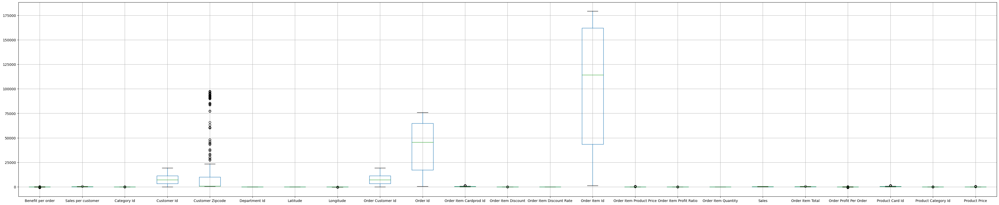

In [22]:
plt.figure(figsize=(50,10))
df.boxplot()




insights:
in the above graph,the numerical value of customer ZIP codes is not required for any calculations or analysis in our context. therefore, the outliers in the ZIP codes can be ignored.

In [23]:
df["order date (DateOrders)"].value_counts()

2015-07-14 18:17:00    3
2016-08-08 03:12:00    3
2015-06-08 02:13:00    3
2017-09-16 00:32:00    3
2015-07-05 08:19:00    3
                      ..
2015-07-11 19:10:00    1
2015-06-27 18:29:00    1
2015-09-16 15:24:00    1
2016-12-08 00:14:00    1
2017-07-05 23:14:00    1
Name: order date (DateOrders), Length: 355, dtype: int64

In [24]:
# Extract the date only from the date- time column
df['Order Date'] = df['order date (DateOrders)'].dt.date

In [25]:
df["Order Date"].value_counts()

2018-01-11    38
2018-01-12    22
2015-07-14     5
2017-07-05     4
2015-03-28     3
              ..
2015-09-17     1
2015-10-17     1
2017-08-01     1
2015-07-25     1
2017-07-16     1
Name: Order Date, Length: 258, dtype: int64

<AxesSubplot:xlabel='Order Date', ylabel='count'>

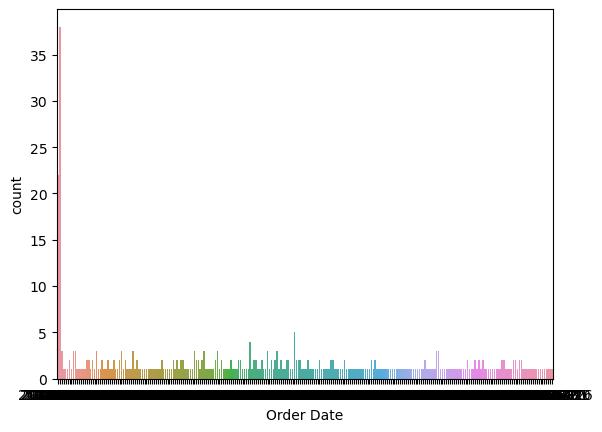

In [26]:
# plot the value counts of the 'column_name' column using Seaborn
sns.countplot(x='Order Date', data=df)

In [27]:
df['Order Date'] = pd.to_datetime(df['Order Date'])
# extract the year from the dates
df['Year'] = df['Order Date'].dt.year
# group the DataFrame by year and aggregate the data
grouped_df = df.groupby('Year')

In [28]:
pd.crosstab(df["Order Date"],df["Year"])

Year,2015,2016,2017,2018
Order Date,,,,
2015-01-09,1,0,0,0
2015-01-17,1,0,0,0
2015-01-21,1,0,0,0
2015-01-24,1,0,0,0
2015-01-27,1,0,0,0
...,...,...,...,...
2017-11-05,0,0,1,0
2017-11-06,0,0,2,0
2017-11-07,0,0,1,0


In [ ]:
#As we want to see yearly data of orders placed it is importantant that we group the data by year and plot separate graphs so that we can compare.

In [29]:
# filter the DataFrame to keep only the data for 2015
year_2015 = df[df['Year'] == 2015].reset_index(drop=True)

<AxesSubplot:xlabel='Order Date', ylabel='count'>

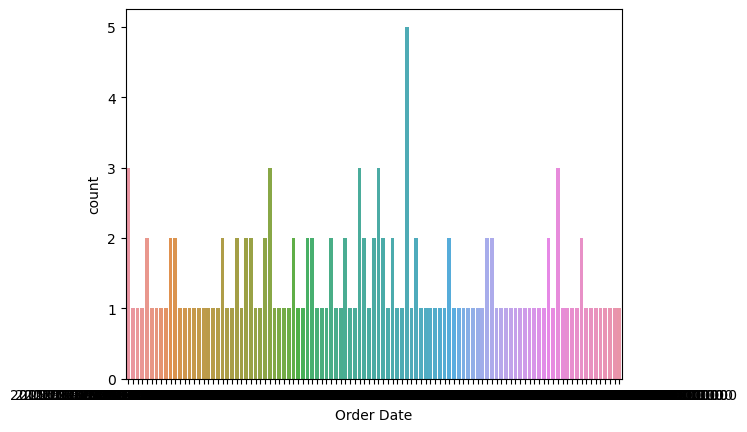

In [30]:
# create the seaborn countplot using the filtered DataFrame
sns.countplot(x='Order Date', data=year_2015)

In [31]:
year_2015.to_excel('2015.xlsx', index=False)

<AxesSubplot:xlabel='Order Date', ylabel='count'>

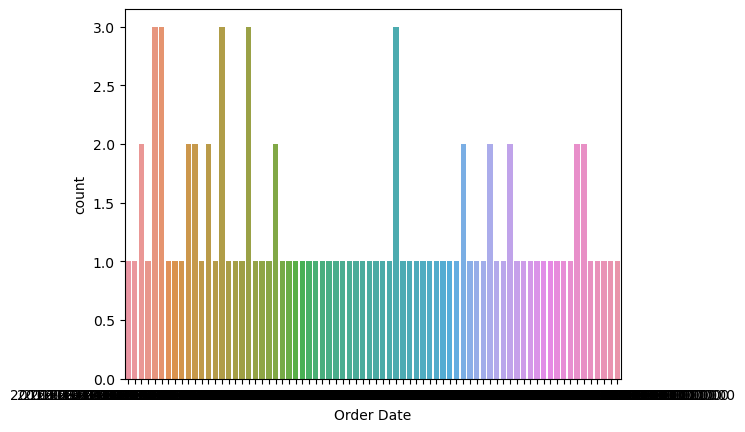

In [32]:
# filter the DataFrame to keep only the data for 2016
year_2016 = df[df['Year'] == 2016].reset_index(drop=True)

# create the seaborn countplot using the filtered DataFrame
sns.countplot(x='Order Date', data=year_2016)

In [33]:
year_2016.to_excel('2016.xlsx', index=False)

<AxesSubplot:xlabel='Order Date', ylabel='count'>

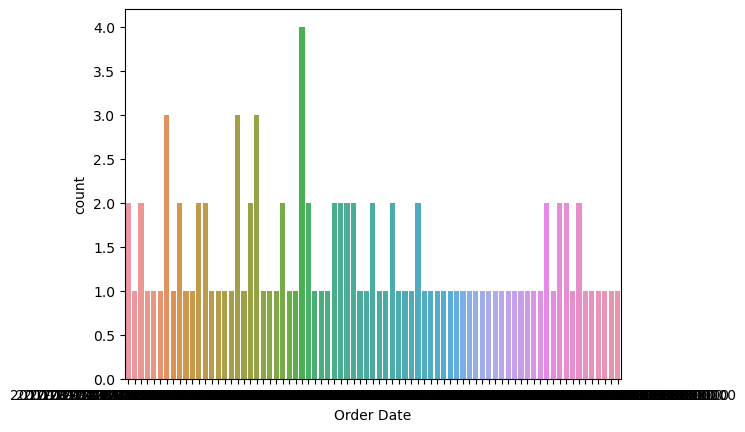

In [34]:
# filter the DataFrame to keep only the data for 2017
year_2017 = df[df['Year'] == 2017].reset_index(drop=True)

# create the seaborn countplot using the filtered DataFrame
sns.countplot(x='Order Date', data=year_2017)

In [35]:
year_2017.to_excel('2017.xlsx', index=False)

<AxesSubplot:xlabel='Order Date', ylabel='count'>

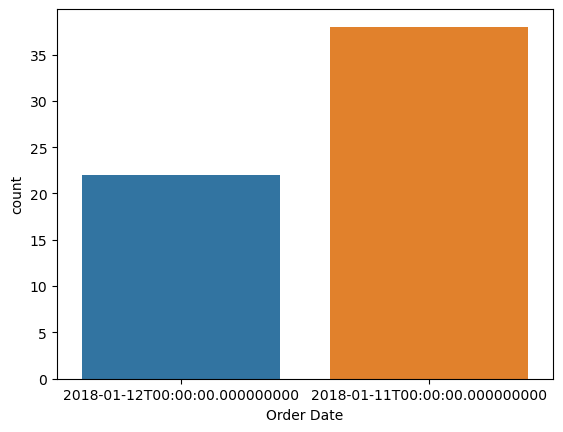

In [36]:
# filter the DataFrame to keep only the data for 2017
year_2018 = df[df['Year'] == 2018].reset_index(drop=True)

# create the seaborn countplot using the filtered DataFrame
sns.countplot(x='Order Date', data=year_2018)

In [37]:
year_2018.to_excel('2018.xlsx', index=False)

### Orders Places on specific days year-wise

In [38]:
#2015
Sorted_year_2015= year_2015["Order Date"].sort_values()
Count_2015= Sorted_year_2015.value_counts(sort=False)
Count_2015.to_excel('Order Count 2015.xlsx')
Count_2015

2015-01-09    1
2015-01-17    1
2015-01-21    1
2015-01-24    1
2015-01-27    1
             ..
2015-12-09    1
2015-12-15    1
2015-12-19    1
2015-12-23    1
2015-12-26    1
Name: Order Date, Length: 105, dtype: int64

In [39]:
Count_2015.max()
#2015-07-14 this date has the highest numbers of orders placed in 2015.

5

In [40]:
#2016
Sorted_year_2016 = year_2016["Order Date"].sort_values()
Count_2016 = Sorted_year_2016.value_counts(sort=False)
Count_2016.to_excel('Order Count 2016.xlsx')
Count_2016

2016-01-07    1
2016-01-10    1
2016-01-13    1
2016-01-16    1
2016-01-31    1
             ..
2016-12-23    1
2016-12-24    1
2016-12-25    3
2016-12-27    1
2016-12-31    2
Name: Order Date, Length: 74, dtype: int64

In [41]:
Count_2016.max()
#2016-04-01
#2016-08-08
#2016-11-28
#2016-11-29
#2016-12-25
#this date has the highest numbers of orders placed in 2016.

3

In [42]:
#2017
Sorted_year_2017 = year_2017["Order Date"].sort_values()
Count_2017 = Sorted_year_2017.value_counts(sort=False)
Count_2017.to_excel('Order Count 2017.xlsx')
Count_2017

2017-01-03    1
2017-01-09    2
2017-01-17    1
2017-01-24    1
2017-01-25    1
             ..
2017-10-02    2
2017-10-19    1
2017-11-05    1
2017-11-06    2
2017-11-07    1
Name: Order Date, Length: 77, dtype: int64

In [43]:
Count_2017.max()
#2017-07-05 this date has the highest numbers of orders placed in 2017.

4

In [44]:
#2018
Sorted_year_2018 = year_2018["Order Date"].sort_values()
Count_2018 = Sorted_year_2018.value_counts(sort=False)
Count_2018.to_excel('Order Count 2018.xlsx')
Count_2018

2018-01-11    38
2018-01-12    22
Name: Order Date, dtype: int64

In [45]:
Count_2018.max()
#2018-01-11 this date has the highest numbers of orders placed in 2018.

38

### Sales by Cities

In [46]:
#To check the sales for cities in 2015
#City_wise_sales_2015

City_wise_sales_2015= year_2015.groupby('Customer City')['Sales'].sum()
City_wise_sales_2015.to_excel('City sales 2015.xlsx')
City_wise_sales_2015.max()

# Caguas has seen the highest sales in 2015 

23238.42048415

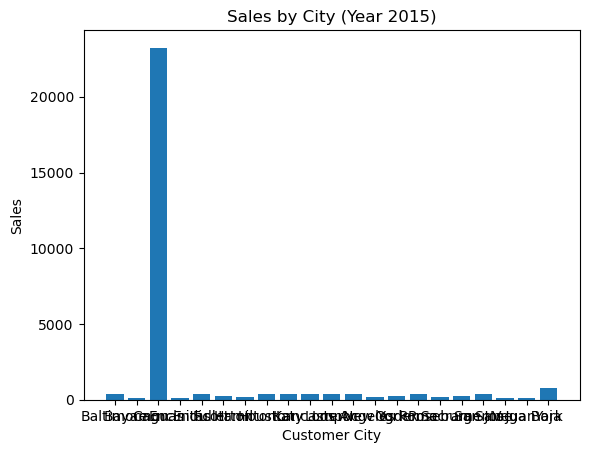

In [47]:
plt.bar(City_wise_sales_2015.index, City_wise_sales_2015.values)
plt.xlabel('Customer City')
plt.ylabel('Sales')
plt.title('Sales by City (Year 2015)')
plt.show()

In [48]:
#To check the sales for cities in 2016
#City_wise_sales_2016

City_wise_sales_2016= year_2016.groupby('Customer City')['Sales'].sum()
City_wise_sales_2016.to_excel('City sales 2016.xlsx')
City_wise_sales_2016.max()
# Caguas has seen the highest sales in 2016

14158.26020376

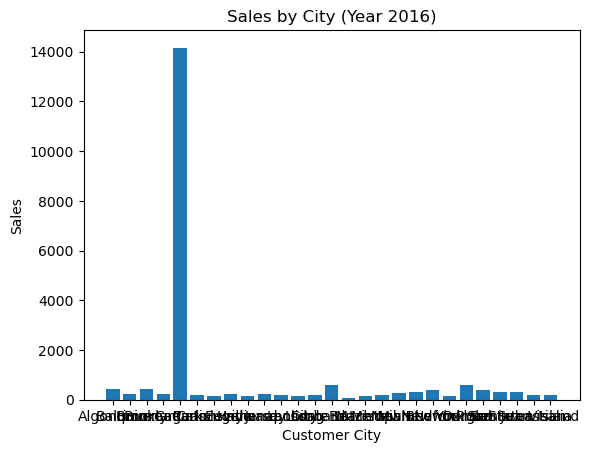

In [49]:
plt.bar(City_wise_sales_2016.index, City_wise_sales_2016.values)
plt.xlabel('Customer City')
plt.ylabel('Sales')
plt.title('Sales by City (Year 2016)')
plt.show()

In [50]:
#To check the sales for cities in 2017
#City_wise_sales_2017

City_wise_sales_2017= year_2017.groupby('Customer City')['Sales'].sum()
City_wise_sales_2017.to_excel('City sales 2017.xlsx')
City_wise_sales_2017.max()
# Caguas has seen the highest sales in 2017 

17724.43023268

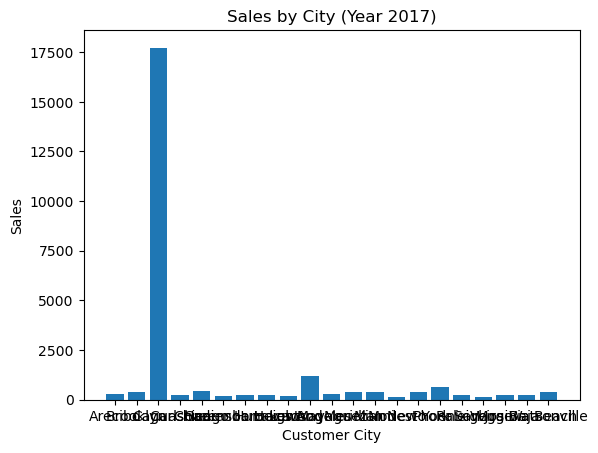

In [51]:
plt.bar(City_wise_sales_2017.index, City_wise_sales_2017.values)
plt.xlabel('Customer City')
plt.ylabel('Sales')
plt.title('Sales by City (Year 2017)')
plt.show()

### Sales by Countries

In [52]:
#Sales by countries in 2015
Country_wise_sales_2015= year_2015.groupby('Order Country')['Sales'].sum()
Highest_sales= Country_wise_sales_2015.max()
Total_sales = Country_wise_sales_2015.sum()
print(f'Highest sales are {Highest_sales} and Total sales are {Total_sales}')
Country_wise_sales_2015.to_excel('Country sales 2015.xlsx')
#Reino Unido saw the highest sales in 2015 followed by Italia

Highest sales are 4429.6701051 and Total sales are 29410.67045392999


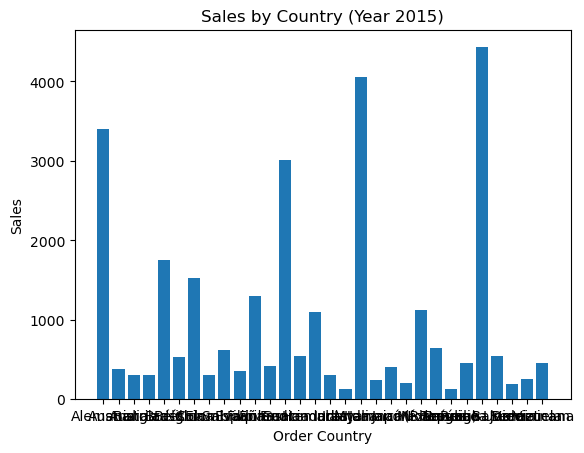

In [53]:
plt.bar(Country_wise_sales_2015.index, Country_wise_sales_2015.values)
plt.xlabel('Order Country')
plt.ylabel('Sales')
plt.title('Sales by Country (Year 2015)')
plt.show()


In [54]:
#Sales by countries in 2016
Country_wise_sales_2016= year_2016.groupby('Order Country')['Sales'].sum()
Highest_sales= Country_wise_sales_2016.max()
Total_sales = Country_wise_sales_2016.sum()
print(f'Highest sales are {Highest_sales} and  Total sales are {Total_sales}')
Country_wise_sales_2016.to_excel('Country sales 2016.xlsx')
#Estados Unidos reported highest sales in 2016

Highest sales are 3282.5700453 and  Total sales are 21225.320308020004


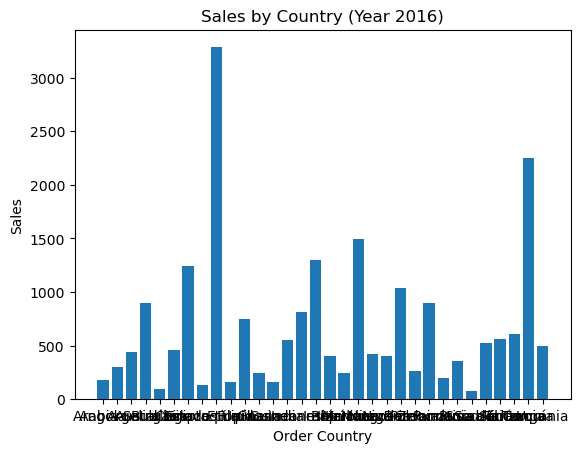

In [55]:
plt.bar(Country_wise_sales_2016.index, Country_wise_sales_2016.values)
plt.xlabel('Order Country')
plt.ylabel('Sales')
plt.title('Sales by Country (Year 2016)')
plt.show()

In [56]:
#Sales by countries in 2017
Country_wise_sales_2017= year_2017.groupby('Order Country')['Sales'].sum()
Highest_sales= Country_wise_sales_2017.max()
Total_sales = Country_wise_sales_2017.sum()
print(f'Highest sales are {Highest_sales} and Total sales are {Total_sales}')
Country_wise_sales_2017.to_excel('Country sales 2017.xlsx')
#Francia reported highest sales in 2017

Highest sales are 3982.6700897 and Total sales are 24783.65026458


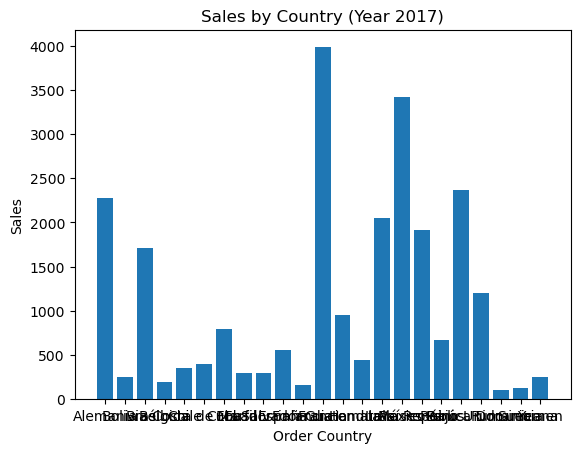

In [57]:
plt.bar(Country_wise_sales_2017.index, Country_wise_sales_2017.values)
plt.xlabel('Order Country')
plt.ylabel('Sales')
plt.title('Sales by Country (Year 2017)')
plt.show()

In [58]:
#Sales by countries in 2018
Country_wise_sales_2018= year_2018.groupby('Order Country')['Sales'].sum()
Highest_sales= Country_wise_sales_2018.max()
Total_sales = Country_wise_sales_2018.sum()
print(f'Highest sales are {Highest_sales} and Total sales are {Total_sales}')
Country_wise_sales_2018.to_excel('Country sales 2018.xlsx')
#India  reported highest sales in 2018 followed by china

Highest sales are 4916.25 and Total sales are 19665.0


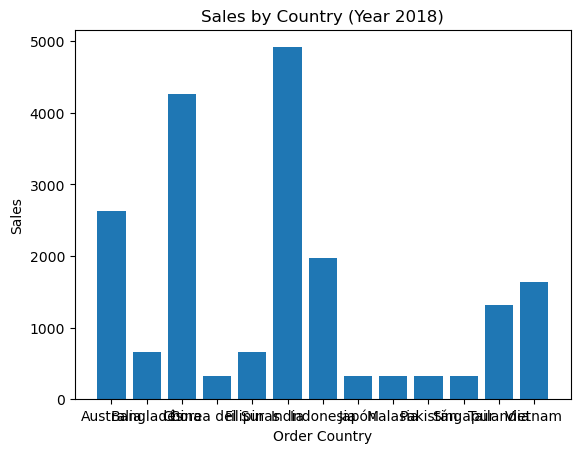

In [59]:
plt.bar(Country_wise_sales_2018.index, Country_wise_sales_2018.values)
plt.xlabel('Order Country')
plt.ylabel('Sales')
plt.title('Sales by Country (Year 2018)')
plt.show()

### Order status

In [60]:
# Order status with respect to countries will show the number of on hold or completed orders till date
pd.crosstab(df["Order Country"],df["Order Status"])

Order Status,CANCELED,CLOSED,COMPLETE,ON_HOLD,PAYMENT_REVIEW,PENDING,PENDING_PAYMENT,PROCESSING,SUSPECTED_FRAUD
Order Country,,,,,,,,,
Alemania,1,0,10,0,0,5,7,0,0
Angola,0,0,0,0,0,0,0,0,1
Arabia Saudí,0,0,0,0,1,0,0,0,0
Argelia,0,0,0,0,0,0,0,2,0
Australia,0,2,3,0,0,3,6,1,1
...,...,...,...,...,...,...,...,...,...
Turquía,0,0,0,0,0,4,3,0,0
Ucrania,0,0,1,0,0,1,2,0,0
Venezuela,0,0,0,0,0,0,0,1,0


In [61]:
Country_wise_status= pd.crosstab(df["Order Country"],df["Order Status"])
Country_wise_status.to_excel('Country status.xlsx')

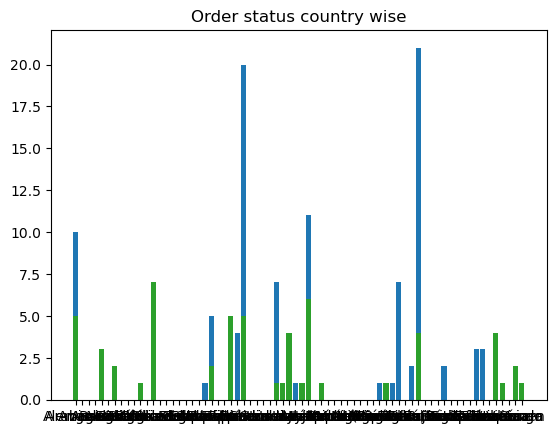

In [62]:
# Extract the data for plotting
countries = Country_wise_status.index
COMPLETE = Country_wise_status['COMPLETE']
ON_HOLD = Country_wise_status['ON_HOLD']
PENDING = Country_wise_status['PENDING']

# Create separate plots for each sales column
plt.bar(countries, COMPLETE, label='COMPLETE')
plt.bar(countries, ON_HOLD, label='ON_HOLD')
plt.bar(countries, PENDING, label='PENDING')

plt.title('Order status country wise')
plt.show()
#Insights: republic democratca del congo and  Francia  has the highest number of Commpleted orders.
#china has the highest numbers of on hold orders
#republic democratca del congo, italia and Francia are some of the counties with highest number of orders

### Top 20 Customers regarding the quanitity of orders

In [63]:
df['Customer_ID_STR']=df['Customer Id'].astype(str)

data_customers=df.groupby(['Customer_ID_STR'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(data_customers.head(20),x='Number of Orders', y='Customer_ID_STR' , color='Number of Orders'      )

### Top 20 Customers regarding profit of all orders

In [64]:
df['Customer_ID_STR']=df['Customer Id'].astype(str)

data_customers_profit=df.groupby(['Customer_ID_STR'])['Order Profit Per Order'].sum().reset_index(name='Profit of Orders').sort_values(by= 'Profit of Orders', ascending= False)
px.bar(data_customers_profit.head(20),x='Profit of Orders', y='Customer_ID_STR' , color='Profit of Orders'      )

### Category

In [65]:
#Category Name
data_Category_Name=df.groupby(['Category Name'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Category_Name, x='Number of Orders',y = 'Category Name',color ='Number of Orders')

In [66]:
data_Region=df.groupby(['Order Region'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by='Number of Orders')
px.bar(data_Region, x='Number of Orders',y = 'Order Region',color ='Number of Orders')

### Geo Features

In [67]:
df_geo=df.groupby([ 'Order Country', 'Order City'])['Order Profit Per Order'].sum().reset_index(name='Profit of Orders').sort_values(by= 'Profit of Orders', ascending= False)

df_geo

,Order Country,Order City,Profit of Orders
54,China,Shantou,558.449997
263,Vietnam,Ho Chi Minh City,493.710004
223,Reino Unido,London,400.480003
132,India,Bangalore,397.899994
159,Italia,Turin,336.439999
...,...,...,...
254,Turquía,Antalya,-420.679993
25,Australia,Sydney,-542.720001
1,Alemania,Berlín,-599.940002
235,República Democrática del Congo,Kinshasa,-604.869991


In [68]:
fig = px.choropleth(df_geo ,  locationmode='country names', locations='Order Country',
                    color='Profit of Orders', # lifeExp is a column of data
                    hover_name='Order Country', 
                    #hover_data ='Order City',
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

In [69]:
import datetime as dt

data_orderdate=df[['order date (DateOrders)', 'Sales']]
data_orderdate['order_date'] = pd.to_datetime(data_orderdate['order date (DateOrders)'])

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\1806371535.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
data_orderdate["Quarter"] = data_orderdate['order_date'].dt.quarter
data_orderdate["Month"] = data_orderdate['order_date'].dt.month
data_orderdate["year"] = data_orderdate['order_date'].dt.year

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\3482627655.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\3482627655.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\3482627655.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

In [71]:
data_orderdate['YearStr']=data_orderdate['year'].astype(str)
df_sales_year=data_orderdate.groupby([ 'YearStr'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_year, x='Sales of Orders',y = 'YearStr',color ='Sales of Orders')

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\3922562175.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [72]:
data_orderdate['QuarterStr']=data_orderdate['Quarter'].astype(str)
df_sales_quarter=data_orderdate.groupby([ 'YearStr','QuarterStr'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_quarter, x='Sales of Orders',y = 'QuarterStr',color ='YearStr')

C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\1609770672.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
data_orderdate['MonthStr']=data_orderdate['Month'].astype(str)
df_sales_m=data_orderdate.groupby([ 'QuarterStr', 'MonthStr'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_m, x='Sales of Orders',y = 'QuarterStr',color ='MonthStr')


C:\Users\GATEWAY\AppData\Local\Temp\ipykernel_11032\3888878285.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [74]:
df['Order_Date_Str']=df['Order Date'].astype(str)

In [75]:
data=df.copy()
data['SUSPECTED_FRAUD'] = np.where(data['Order Status'] == 'SUSPECTED_FRAUD', 1, 0)

In [76]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
def Labelencoder_feature(x):
    le=LabelEncoder()
    x=le.fit_transform(x)
    return x

In [77]:
features=data.drop(columns=['SUSPECTED_FRAUD','Order Status' ])
target=data['SUSPECTED_FRAUD']

In [78]:
features.isnull().sum()

Type                          0
Benefit per order             0
Sales per customer            0
Category Id                   0
Category Name                 0
Customer City                 0
Customer Country              0
Customer Fname                0
Customer Id                   0
Customer Lname                0
Customer Segment              0
Customer State                0
Customer Street               0
Customer Zipcode              0
Department Id                 0
Department Name               0
Latitude                      0
Longitude                     0
Market                        0
Order City                    0
Order Country                 0
Order Customer Id             0
order date (DateOrders)       0
Order Id                      0
Order Item Cardprod Id        0
Order Item Discount           0
Order Item Discount Rate      0
Order Item Id                 0
Order Item Product Price      0
Order Item Profit Ratio       0
Order Item Quantity           0
Sales   

In [79]:
features=features.apply(Labelencoder_feature)
features.head()

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str
0,1,294,139,17,12,21,0,123,341,31,1,10,136,53,0,1,330,61,3,210,12,341,354,354,35,127,16,400,19,70,0,31,139,294,5,155,35,17,15,19,316,257,3,134,257
1,2,252,130,17,12,11,1,137,340,106,0,18,160,4,0,1,2,136,3,60,32,340,353,353,35,134,17,399,19,63,0,31,130,252,13,182,35,17,15,19,315,257,3,133,257
2,1,8,169,17,12,60,0,98,339,66,0,19,289,43,0,1,279,54,3,60,32,339,352,352,35,0,0,398,19,8,0,31,169,8,13,182,35,17,15,19,344,257,3,132,257
3,2,10,168,17,12,11,1,110,338,95,0,18,279,4,0,1,78,134,3,103,38,338,351,351,35,14,1,397,19,9,0,31,168,10,5,92,35,17,15,19,333,257,3,131,257
4,1,113,167,17,12,18,0,97,337,78,1,15,259,48,0,1,321,65,3,113,49,337,350,350,35,30,2,396,19,46,0,31,167,113,11,139,35,17,15,19,324,257,3,130,257


In [80]:
df["Order Date"]

0     2018-01-12
1     2018-01-12
2     2018-01-12
3     2018-01-12
4     2018-01-12
         ...    
396   2015-06-01
397   2017-07-10
398   2017-07-16
399   2017-06-25
400   2017-07-05
Name: Order Date, Length: 401, dtype: datetime64[ns]

In [81]:
features.head(2)

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str
0,1,294,139,17,12,21,0,123,341,31,1,10,136,53,0,1,330,61,3,210,12,341,354,354,35,127,16,400,19,70,0,31,139,294,5,155,35,17,15,19,316,257,3,134,257
1,2,252,130,17,12,11,1,137,340,106,0,18,160,4,0,1,2,136,3,60,32,340,353,353,35,134,17,399,19,63,0,31,130,252,13,182,35,17,15,19,315,257,3,133,257


In [83]:
#deleting features which high-correlated with other features to avoid multicollinarity
data1=pd.concat([features,target],axis=1)

In [84]:
data1

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str,SUSPECTED_FRAUD
0,1,294,139,17,12,21,0,123,341,31,1,10,136,53,0,1,330,61,3,210,12,341,354,354,35,127,16,400,19,70,0,31,139,294,5,155,35,17,15,19,316,257,3,134,257,0
1,2,252,130,17,12,11,1,137,340,106,0,18,160,4,0,1,2,136,3,60,32,340,353,353,35,134,17,399,19,63,0,31,130,252,13,182,35,17,15,19,315,257,3,133,257,0
2,1,8,169,17,12,60,0,98,339,66,0,19,289,43,0,1,279,54,3,60,32,339,352,352,35,0,0,398,19,8,0,31,169,8,13,182,35,17,15,19,344,257,3,132,257,0
3,2,10,168,17,12,11,1,110,338,95,0,18,279,4,0,1,78,134,3,103,38,338,351,351,35,14,1,397,19,9,0,31,168,10,5,92,35,17,15,19,333,257,3,131,257,0
4,1,113,167,17,12,18,0,97,337,78,1,15,259,48,0,1,321,65,3,113,49,337,350,350,35,30,2,396,19,46,0,31,167,113,11,139,35,17,15,19,324,257,3,130,257,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,3,54,127,6,4,64,0,127,19,180,0,21,266,63,2,0,319,40,1,41,53,19,29,29,12,0,0,31,14,33,2,25,127,54,8,83,12,6,13,14,30,26,0,239,26,0
397,3,282,127,6,4,68,0,108,28,203,0,12,76,34,2,0,278,72,1,216,0,28,254,254,12,0,0,291,14,70,2,25,127,282,20,146,12,6,13,14,254,221,2,52,221,0
398,3,346,122,6,4,83,0,5,198,40,0,22,217,32,2,0,284,79,1,159,26,198,256,256,12,23,2,293,14,87,2,25,122,346,20,131,12,6,13,14,256,223,2,310,223,0
399,3,114,121,6,4,13,0,108,7,180,0,1,20,81,2,0,247,35,1,119,53,7,246,246,12,33,3,281,14,49,2,25,121,114,8,83,12,6,13,14,246,217,2,175,217,0


In [86]:
data1.corr()

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str,SUSPECTED_FRAUD
Type,1.000000,0.121298,0.309532,-0.253619,-0.134409,0.238699,-0.262395,0.009418,-0.064373,0.055802,-0.146257,-0.233827,-0.062859,0.201835,0.287194,0.469345,0.173430,-0.266906,0.005833,-0.017639,-0.043003,-0.064373,-0.152562,-0.152562,-0.257831,0.219386,0.090823,-0.155761,-0.487614,0.005438,0.788316,0.323823,0.309532,0.121298,-0.243033,0.021797,-0.257831,-0.253619,0.304844,-0.487614,-0.155070,-0.130342,-0.122419,0.050368,-0.130342,0.258939
Benefit per order,0.121298,1.000000,0.387546,0.060861,-0.022973,0.157585,-0.187026,-0.055801,0.138203,-0.007815,0.019528,-0.177057,-0.019736,0.224225,-0.169817,0.016704,0.130679,-0.201244,0.073687,-0.055315,-0.026022,0.138203,0.147815,0.147815,0.064504,0.199427,0.020715,0.147764,0.189490,0.848282,0.076907,0.393701,0.387546,1.000000,-0.033247,-0.037151,0.064504,0.060861,-0.010782,0.189490,0.148989,0.144414,0.149308,-0.132370,0.144414,0.071915
Sales per customer,0.309532,0.387546,1.000000,0.177363,-0.158958,0.187792,-0.263478,-0.046243,0.307262,-0.049361,0.090553,-0.183607,0.010720,0.235030,-0.500898,0.045243,0.201674,-0.187710,0.315788,-0.041692,-0.061344,0.307262,0.355101,0.355101,0.187778,0.358476,-0.048063,0.352667,0.434367,-0.003118,0.237432,0.970659,1.000000,0.387546,-0.056279,-0.039739,0.187778,0.177363,0.074612,0.434367,0.356343,0.332619,0.390764,-0.131203,0.332619,0.053470
Category Id,-0.253619,0.060861,0.177363,1.000000,0.437155,0.039487,-0.169655,-0.071035,0.573450,-0.143726,0.155385,-0.102927,0.020961,0.135862,-0.264432,0.109355,0.113625,-0.026515,0.373714,-0.041697,-0.079035,0.573450,0.552052,0.552052,0.994485,-0.012317,-0.052964,0.549028,0.216719,-0.022834,-0.407506,0.163310,0.177363,0.060861,-0.157297,0.030168,0.994485,1.000000,0.189678,0.216719,0.551831,0.496881,0.617142,-0.285862,0.496881,-0.014933
Category Name,-0.134409,-0.022973,-0.158958,0.437155,1.000000,-0.044987,-0.004201,-0.067259,0.131798,-0.024043,0.066685,0.064286,-0.079588,-0.046046,0.163111,0.338837,0.019350,0.064787,0.077212,0.018599,0.051901,0.131798,0.211118,0.211118,0.364808,-0.111240,-0.044833,0.210660,-0.001292,0.048223,-0.158646,-0.094678,-0.158958,-0.022973,-0.079397,0.035380,0.364808,0.437155,-0.140220,-0.001292,0.210810,0.195142,0.240511,-0.086826,0.195142,0.028070
Customer City,0.238699,0.157585,0.187792,0.039487,-0.044987,1.000000,-0.682180,-0.043472,0.075959,-0.000788,-0.143734,-0.560667,0.060002,0.597464,-0.176658,0.084085,0.550464,-0.618868,-0.181536,-0.077998,0.010948,0.075959,0.163335,0.163335,0.044581,0.149808,0.095458,0.163044,0.048184,0.080351,0.003473,0.203484,0.187792,0.157585,0.111947,0.001268,0.044581,0.039487,0.101072,0.048184,0.162033,0.153310,0.143622,-0.103715,0.153310,0.087172
Customer Country,-0.262395,-0.187026,-0.263478,-0.169655,-0.004201,-0.682180,1.000000,0.071106,-0.202828,0.023720,0.176107,0.781206,-0.043423,-0.842088,0.277217,-0.085778,-0.779094,0.863266,0.229842,0.096160,0.001061,-0.202828,-0.280076,-0.280076,-0.175779,-0.149205,-0.060970,-0.279426,-0.090150,-0.084447,0.063219,-0.278705,-0.263478,-0.187026,-0.045430,0.009526,-0.175779,-0.169655,-0.139633,-0.090150,-0.279802,-0.264705,-0.259675,0.157816,-0.264705,-0.077634
Customer Fname,0.009418,-0.055801,-0.046243,-0.071035,-0.067259,-0.043472,0.071106,1.000000,-0.092511,0.024049,-0.003463,0.020312,0.005842,-0.067137,0.102173

In [87]:
data1.head(1)

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str,SUSPECTED_FRAUD
0,1,294,139,17,12,21,0,123,341,31,1,10,136,53,0,1,330,61,3,210,12,341,354,354,35,127,16,400,19,70,0,31,139,294,5,155,35,17,15,19,316,257,3,134,257,0


In [94]:
new_features=data1.drop(columns=["Benefit per order","Sales per customer","Category Id","Category Name","Customer City","Customer Fname","Customer Id","Customer Lname","Customer State","Customer Street","Customer Zipcode","Department Id","Department Name","Latitude","Longitude","Market","Order Customer Id","order date (DateOrders)","Order Id","Order Item Cardprod Id","Order Item Discount","Order Item Discount Rate","Order Item Id","Order Item Product Price","Order Item Product Price","Order Item Quantity","Order Item Total","Order Profit Per Order","Product Card Id","Product Category Id","Product Name","Product Price","Order Date","Year","Customer_ID_STR","Order_Date_Str"])

<AxesSubplot:>

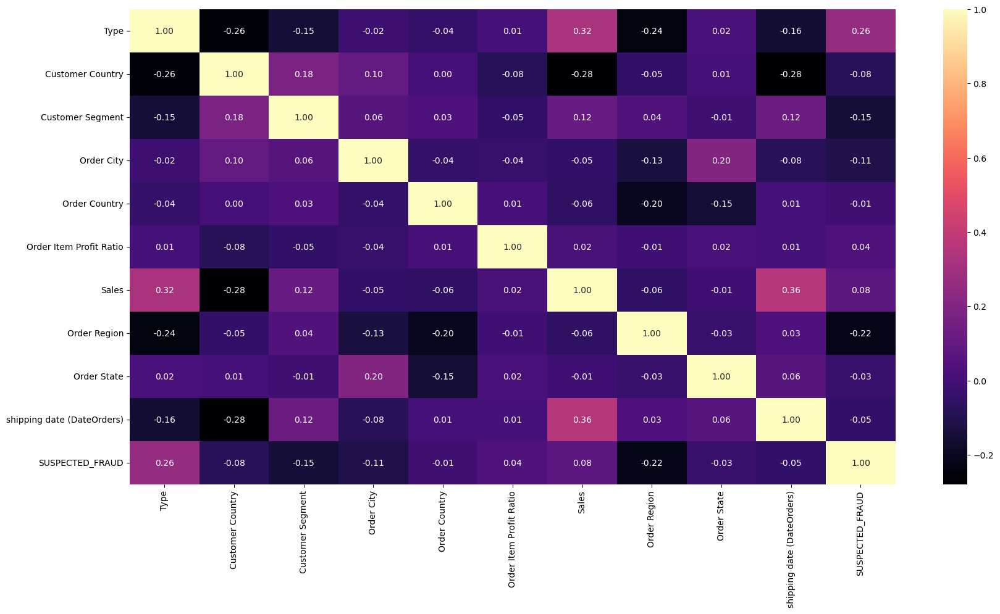

In [99]:
fig = plt.figure(figsize=(20,10))
sns.heatmap(new_features.corr(), annot = True, fmt = '.2f', cmap = 'magma')

### logestic regression

In [102]:
x = new_features.drop("SUSPECTED_FRAUD",axis=1)
y = new_features["SUSPECTED_FRAUD"]
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42,stratify=y)

In [103]:
lg_model = LogisticRegression(multi_class="ovr")
lg_model.fit(x_train,y_train)

LogisticRegression(multi_class='ovr')

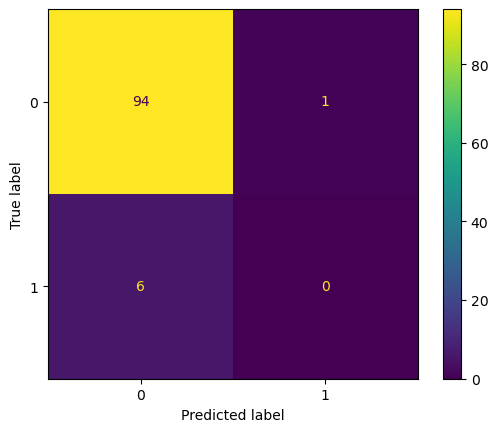

In [104]:
plot_confusion_matrix(lg_model,x_test,y_test)

In [105]:
y_pred = lg_model.predict(x_test)
cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)
multilable_matrix  = multilabel_confusion_matrix(y_test,y_pred)
print("Multilabel confusion matrix\n",multilable_matrix)
accuracy = accuracy_score(y_test,y_pred)
print("Accuaracy\n",accuracy)
clf_report = classification_report(y_test,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[94  1]
 [ 6  0]]
Multilabel confusion matrix
 [[[ 0  6]
  [ 1 94]]

 [[94  1]
  [ 6  0]]]
Accuaracy
 0.9306930693069307
Classification report
               precision    recall  f1-score   support

           0       0.94      0.99      0.96        95
           1       0.00      0.00      0.00         6

    accuracy                           0.93       101
   macro avg       0.47      0.49      0.48       101
weighted avg       0.88      0.93      0.91       101



In [106]:
y_pred = lg_model.predict(x_train)
cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)
multilable_matrix  = multilabel_confusion_matrix(y_train,y_pred)
print("Multilabel confusion matrix\n",multilable_matrix)
accuracy = accuracy_score(y_train,y_pred)
print("Accuaracy\n",accuracy)
clf_report = classification_report(y_train,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[279   2]
 [ 17   2]]
Multilabel confusion matrix
 [[[  2  17]
  [  2 279]]

 [[279   2]
  [ 17   2]]]
Accuaracy
 0.9366666666666666
Classification report
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       281
           1       0.50      0.11      0.17        19

    accuracy                           0.94       300
   macro avg       0.72      0.55      0.57       300
weighted avg       0.91      0.94      0.92       300



### KNN

In [189]:
knn_model = KNeighborsClassifier(n_neighbors=5,p=2)
knn_model.fit(x_train,y_train)

KNeighborsClassifier()

In [117]:
x = new_features.drop("SUSPECTED_FRAUD",axis=1)
y = new_features["SUSPECTED_FRAUD"]
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42,stratify=y)

In [118]:
knn_model = KNeighborsClassifier(n_neighbors=5,p=2)
knn_model.fit(x_train,y_train)

KNeighborsClassifier()

### testing

In [119]:
y_pred = knn_model.predict(x_test)
cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)

accuracy = accuracy_score(y_test,y_pred)
print("Accuracy\n",accuracy)

clf_report = classification_report(y_test,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[95  0]
 [ 6  0]]
Accuracy
 0.9405940594059405
Classification report
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        95
           1       0.00      0.00      0.00         6

    accuracy                           0.94       101
   macro avg       0.47      0.50      0.48       101
weighted avg       0.88      0.94      0.91       101



### training

In [121]:
y_pred = knn_model.predict(x_train)
cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)

accuracy = accuracy_score(y_train,y_pred)
print("Accuracy\n",accuracy)

clf_report = classification_report(y_train,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[280   1]
 [ 18   1]]
Accuracy
 0.9366666666666666
Classification report
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       281
           1       0.50      0.05      0.10        19

    accuracy                           0.94       300
   macro avg       0.72      0.52      0.53       300
weighted avg       0.91      0.94      0.91       300



### DecisionTree

In [122]:
dt_clf = DecisionTreeClassifier()
dt_clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [123]:
# On test data
y_pred  = dt_clf.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_test,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_test,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[88  7]
 [ 4  2]]
accuracy 
 0.8910891089108911
Classification Report 
               precision    recall  f1-score   support

           0       0.96      0.93      0.94        95
           1       0.22      0.33      0.27         6

    accuracy                           0.89       101
   macro avg       0.59      0.63      0.60       101
weighted avg       0.91      0.89      0.90       101



In [124]:
# On train data
y_pred  = dt_clf.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_train,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_train,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[281   0]
 [  0  19]]
accuracy 
 1.0
Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       281
           1       1.00      1.00      1.00        19

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300



In [133]:
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.model_selection import train_test_split,GridSearchCV


plt.figure(figsize=(200,150))
plot_tree(dt_clf,feature_names=x.columns,class_names=["0","1"],filled=True)
plt.savefig("Decision tree without hyperparametr tuning (100% on train).png")

### Hyperparameter Tuning

In [125]:
dt_model = DecisionTreeClassifier()
hyperparamter = {"criterion":["gini","entropy"],
                "max_depth":np.arange(3,8),
                "min_samples_split":np.arange(2,20),
                "min_samples_leaf":np.arange(2,15)}
gscv =GridSearchCV(dt_model,hyperparamter,cv=5)
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([3, 4, 5, 6, 7]),
                         'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19])})

In [126]:
gscv.best_estimator_

DecisionTreeClassifier(max_depth=3, min_samples_leaf=2, min_samples_split=6)

In [127]:
# Testing data
dt_clf = gscv.best_estimator_
y_pred  = dt_clf.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_test,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_test,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[93  2]
 [ 6  0]]
accuracy 
 0.9207920792079208
Classification Report 
               precision    recall  f1-score   support

           0       0.94      0.98      0.96        95
           1       0.00      0.00      0.00         6

    accuracy                           0.92       101
   macro avg       0.47      0.49      0.48       101
weighted avg       0.88      0.92      0.90       101



In [128]:
# Training Data
y_pred  = dt_clf.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_train,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_train,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[280   1]
 [ 13   6]]
accuracy 
 0.9533333333333334
Classification Report 
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       281
           1       0.86      0.32      0.46        19

    accuracy                           0.95       300
   macro avg       0.91      0.66      0.72       300
weighted avg       0.95      0.95      0.94       300



In [134]:
plt.figure(figsize=(200,150))
plot_tree(dt_clf,feature_names=x.columns,class_names=["0","1"],filled=True)
plt.savefig("Decision tree with hyperparametr tuning .png")

### Forecasting Sales of different products

In [144]:
data_sales=features.copy()
data_sales.head(1)

,Type,Benefit per order,Sales per customer,Category Id,Category Name,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Order Date,Year,Customer_ID_STR,Order_Date_Str
0,1,294,139,17,12,21,0,123,341,31,1,10,136,53,0,1,330,61,3,210,12,341,354,354,35,127,16,400,19,70,0,31,139,294,5,155,35,17,15,19,316,257,3,134,257


In [153]:
features_sales=data_sales.drop(columns=['Sales', 'Order Item Quantity', 'Order Item Product Price'])
target=data_sales['Sales']

In [155]:
#Feature Selection based on importance
from sklearn.feature_selection import f_regression
F_values, p_values  = f_regression(features, target)

In [156]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [157]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value'])
f_reg_results.P_Value= f_reg_results.P_Value.astype(float)
f_reg_results=f_reg_results[f_reg_results.P_Value<0.06]
f_reg_results

,Variable,F_Value,P_Value
0,Type,4.674116e+01,0.000
42,Year,7.041564e+01,0.000
41,Order Date,5.117842e+01,0.000
40,shipping date (DateOrders),5.831132e+01,0.000
39,Product Price,1.000001e+02,0.000
33,Order Profit Per Order,7.318963e+01,0.000
32,Order Item Total,6.501691e+03,0.000
31,Sales,1.497447e+17,0.000
30,Order Item Quantity,2.846597e+01,0.000
28,Order Item Product Price,1.000001e+02,0.000


In [162]:
f_reg_list=f_reg_results.Variable.values
_reg_list

array(['Type', 'Year', 'Order Date', 'shipping date (DateOrders)',
       'Product Price', 'Order Profit Per Order', 'Order Item Total',
       'Sales', 'Order Item Quantity', 'Order Item Product Price',
       'Order Item Id', 'Order Item Discount', 'Order Id',
       'Order Customer Id', 'Market', 'Longitude',
       'order date (DateOrders)', 'Customer Id', 'Benefit per order',
       'Sales per customer', 'Customer City', 'Customer Country',
       'Latitude', 'Customer State', 'Order_Date_Str', 'Department Id',
       'Customer Zipcode', 'Category Id', 'Order Item Cardprod Id',
       'Product Card Id', 'Product Category Id', 'Customer_ID_STR',
       'Customer Segment', 'Order Item Discount Rate', 'Category Name'],
      dtype=object)

In [164]:
final_features=features_sales[['Order Id', 'Order Item Discount', 'Order Item Cardprod Id',
       'shipping date (DateOrders)', 'order date (DateOrders)',
       'Order Customer Id', 'Order Profit Per Order', 'Market',
       'Order Region', 'Order State', 'Order Item Total',
       'Department Name', 'Product Card Id', 'Customer Id',
       'Product Category Id', 'Category Name',
       'Product Name', 'Product Price', 'Sales per customer',
       'Benefit per order', 'Order Item Id',
       'Order City', 'Customer Segment']]

In [165]:
final_data=pd.concat([final_features, target], axis=1)

<AxesSubplot:>

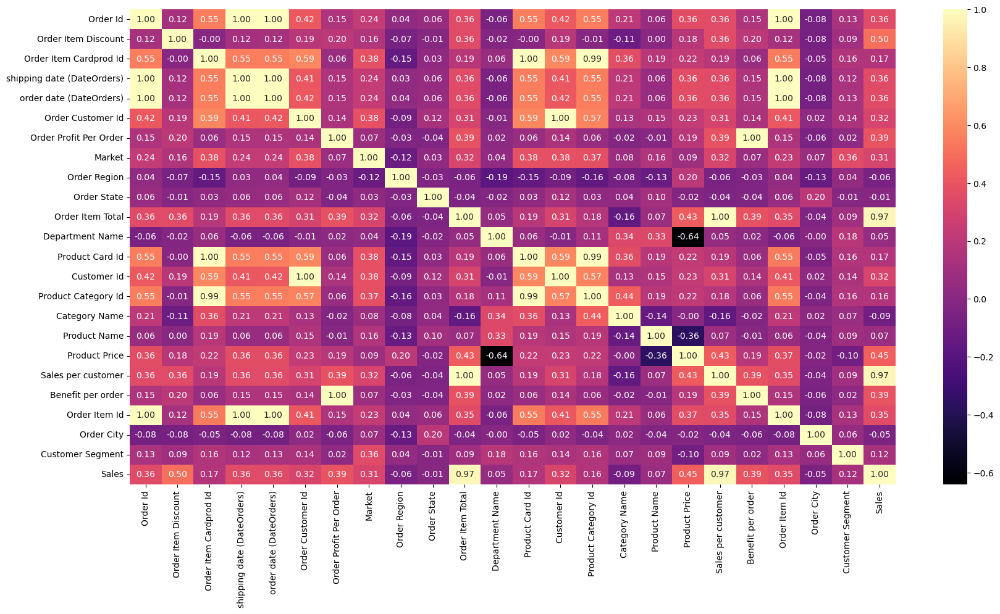

In [166]:
fig = plt.figure(figsize=(20,10))
sns.heatmap(final_data.corr(), annot = True, fmt = '.2f', cmap = 'magma')

### KNN

In [191]:
x = final_data.drop("Sales",axis=1)
y = final_data["Sales"]
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42,stratify=y)

ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

In [171]:
knn_model = KNeighborsClassifier(n_neighbors=5,p=2)
knn_model.fit(x_train,y_train)

KNeighborsClassifier()

In [172]:
y_pred = knn_model.predict(x_test)
cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)

accuracy = accuracy_score(y_test,y_pred)
print("Accuracy\n",accuracy)

clf_report = classification_report(y_test,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[95  0]
 [ 6  0]]
Accuracy
 0.9405940594059405
Classification report
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        95
           1       0.00      0.00      0.00         6

    accuracy                           0.94       101
   macro avg       0.47      0.50      0.48       101
weighted avg       0.88      0.94      0.91       101



In [173]:
y_pred = knn_model.predict(x_test)
cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)

accuracy = accuracy_score(y_test,y_pred)
print("Accuracy\n",accuracy)

clf_report = classification_report(y_test,y_pred)
print("Classification report\n",clf_report)

Confusion matrix
 [[280   1]
 [ 18   1]]
Accuracy
 0.9366666666666666
Classification report
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       281
           1       0.50      0.05      0.10        19

    accuracy                           0.94       300
   macro avg       0.72      0.52      0.53       300
weighted avg       0.91      0.94      0.91       300



In [175]:
dt_clf = DecisionTreeClassifier()
dt_clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [176]:
# On test data
y_pred  = dt_clf.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_test,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_test,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[89  6]
 [ 4  2]]
accuracy 
 0.900990099009901
Classification Report 
               precision    recall  f1-score   support

           0       0.96      0.94      0.95        95
           1       0.25      0.33      0.29         6

    accuracy                           0.90       101
   macro avg       0.60      0.64      0.62       101
weighted avg       0.91      0.90      0.91       101



In [177]:
# On train data
y_pred  = dt_clf.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_train,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_train,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[281   0]
 [  0  19]]
accuracy 
 1.0
Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       281
           1       1.00      1.00      1.00        19

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300



### hyperparamter

In [178]:
dt_model = DecisionTreeClassifier()
hyperparamter = {"criterion":["gini","entropy"],
                "max_depth":np.arange(3,8),
                "min_samples_split":np.arange(2,20),
                "min_samples_leaf":np.arange(2,15)}
gscv =GridSearchCV(dt_model,hyperparamter,cv=5)
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([3, 4, 5, 6, 7]),
                         'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19])})

In [179]:
gscv.best_estimator_

DecisionTreeClassifier(max_depth=3, min_samples_leaf=2, min_samples_split=4)

In [180]:
# Testing data
dt_clf = gscv.best_estimator_
y_pred  = dt_clf.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_test,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_test,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[93  2]
 [ 6  0]]
accuracy 
 0.9207920792079208
Classification Report 
               precision    recall  f1-score   support

           0       0.94      0.98      0.96        95
           1       0.00      0.00      0.00         6

    accuracy                           0.92       101
   macro avg       0.47      0.49      0.48       101
weighted avg       0.88      0.92      0.90       101



In [181]:
# Training Data
y_pred  = dt_clf.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print("Confusion matrix\n",cnf_matrix)
accuracy = accuracy_score(y_train,y_pred)
print("accuracy \n",accuracy)
clf_report = classification_report(y_train,y_pred)
print("Classification Report \n",clf_report)

Confusion matrix
 [[280   1]
 [ 13   6]]
accuracy 
 0.9533333333333334
Classification Report 
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       281
           1       0.86      0.32      0.46        19

    accuracy                           0.95       300
   macro avg       0.91      0.66      0.72       300
weighted avg       0.95      0.95      0.94       300

